# Проект SF Scoring - построение модели банковского скоринга.
**Автор - Михаил Пустовалов**
Версия 1, от 15 февраля 2021

# 0. Введение.
В этом проекте рассматривается задача банковского скоринга - принятие решения о том, будет ли заёмщик проблемным (т.е. допустит дефолт по кредиту) или нет. Решение принимается по набору различных признаков для каждого клиента, таких как наличие машины, загранпаспорта, доходы, и прочие. Для принятия решений о новых клиентах используется модель, обученная на исторических данных о нескольких десятках тысяч клиентов, о которых известно, были ли они проблемными или нет. Таким образом, задача является бинарной классификацией, и может быть решена различными методами: логистической регрессией, методом опорных векторов, различными методами решающих деревьев, и простыми методами классификации (наивный байесовский классификатор и kNN). Основной метрикой соревнования на kaggle является ROC AUC Score, хотя также будут проанализированы и другие метрики классификации (confusion matrix, accuracy, precision, recall, F1 score). 
### Cодержание.
1) EDA при помощи библиотеки dataprep.\
2) Подготовка пайплайнов sklearn для преобразования данных и генерации новых фичей.\
3) Применение простейших моделей - наивный Байес и kNN, валидация и подбор гиперпараметров.\
4) Применение линейных моделей логистической регрессии и метода опорных векторов, валидация, подбор гиперпараметров.\
5) Применение XGBoost и catBoost, валидация и подбор гиперпараметров.\
6) Сравнение метрик, выводы.

# 1. EDA.
Датасет уже очень хорошо подготовлен. Для упрощения EDA будем использовать модуль dataprep.eda.

In [79]:
#!pip install -U dataprep
import dataprep.eda
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline, Pipeline, FeatureUnion
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, StandardScaler, FunctionTransformer, MinMaxScaler, PolynomialFeatures
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.feature_selection import f_classif,mutual_info_classif, SelectKBest, SelectFromModel
from sklearn.metrics import (plot_confusion_matrix, plot_roc_curve, f1_score, confusion_matrix, 
                             precision_score, precision_recall_curve, accuracy_score, recall_score, 
                             plot_precision_recall_curve, roc_auc_score)
from sklearn import set_config
import xgboost as xgb
set_config(display='diagram')

In [81]:
#подгрузка данных
train = pd.read_csv('input/train.csv')
test = pd.read_csv('input/test.csv')
sample_sub = pd.read_csv('input/sample_submission.csv')

Начнём последовательно осматривать фреймы train и test.

In [82]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        73799 non-null  int64 

In [83]:
train.describe()

,client_id,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,default
count,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000
mean,55137.965094,39.280641,0.275749,0.164894,-1.904724,2.000339,56.725701,1.575509,2.496280,41099.775417,1.733330,2.765458,0.126994
std,31841.921168,11.520378,0.804272,0.371087,0.498231,2.252073,13.055717,0.527631,0.689818,46166.322400,1.123622,1.009463,0.332968
min,1.000000,21.000000,0.000000,0.000000,-3.624586,0.000000,20.000000,1.000000,1.000000,1000.000000,1.000000,1.000000,0.000000
25%,27440.500000,30.000000,0.000000,0.000000,-2.259534,0.000000,50.000000,1.000000,2.000000,20000.000000,1.000000,2.000000,0.000000
50%,55274.000000,37.000000,0.000000,0.000000,-1.920823,1.000000,50.000000,2.000000,3.000000,30000.000000,1.000000,3.000000,0.000000
75%,82758.500000,48.000000,0.000000,0.000000,-1.569831,3.000000,60.000000,2.000000,3.000000,48000.000000,2.000000,4.000000,0.000000
max,110147.000000,72.000000,33.000000,1.000000,0.199773,53.000000,80.000000,3.000000,3.000000,1000000.000000,4.000000,4.000000,1.000000


In [84]:
train.describe()

,client_id,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,default
count,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000,73799.000000
mean,55137.965094,39.280641,0.275749,0.164894,-1.904724,2.000339,56.725701,1.575509,2.496280,41099.775417,1.733330,2.765458,0.126994
std,31841.921168,11.520378,0.804272,0.371087,0.498231,2.252073,13.055717,0.527631,0.689818,46166.322400,1.123622,1.009463,0.332968
min,1.000000,21.000000,0.000000,0.000000,-3.624586,0.000000,20.000000,1.000000,1.000000,1000.000000,1.000000,1.000000,0.000000
25%,27440.500000,30.000000,0.000000,0.000000,-2.259534,0.000000,50.000000,1.000000,2.000000,20000.000000,1.000000,2.000000,0.000000
50%,55274.000000,37.000000,0.000000,0.000000,-1.920823,1.000000,50.000000,2.000000,3.000000,30000.000000,1.000000,3.000000,0.000000
75%,82758.500000,48.000000,0.000000,0.000000,-1.569831,3.000000,60.000000,2.000000,3.000000,48000.000000,2.000000,4.000000,0.000000
max,110147.000000,72.000000,33.000000,1.000000,0.199773,53.000000,80.000000,3.000000,3.000000,1000000.000000,4.000000,4.000000,1.000000


In [85]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36349 entries, 0 to 36348
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         36349 non-null  int64  
 1   app_date          36349 non-null  object 
 2   education         36178 non-null  object 
 3   sex               36349 non-null  object 
 4   age               36349 non-null  int64  
 5   car               36349 non-null  object 
 6   car_type          36349 non-null  object 
 7   decline_app_cnt   36349 non-null  int64  
 8   good_work         36349 non-null  int64  
 9   score_bki         36349 non-null  float64
 10  bki_request_cnt   36349 non-null  int64  
 11  region_rating     36349 non-null  int64  
 12  home_address      36349 non-null  int64  
 13  work_address      36349 non-null  int64  
 14  income            36349 non-null  int64  
 15  sna               36349 non-null  int64  
 16  first_time        36349 non-null  int64 

In [86]:
test.describe()

,client_id,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time
count,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000,36349.000000
mean,54945.647473,39.186002,0.268040,0.166772,-1.904152,2.014471,56.802938,1.573798,2.501087,40835.755729,1.728053,2.765798
std,31706.052195,11.513258,0.788478,0.372777,0.501764,2.296789,13.086646,0.527428,0.683227,43802.180951,1.120686,1.011560
min,4.000000,21.000000,0.000000,0.000000,-3.574197,0.000000,20.000000,1.000000,1.000000,1000.000000,1.000000,1.000000
25%,27744.000000,30.000000,0.000000,0.000000,-2.261909,0.000000,50.000000,1.000000,2.000000,20000.000000,1.000000,2.000000
50%,54657.000000,37.000000,0.000000,0.000000,-1.920823,1.000000,50.000000,2.000000,3.000000,30000.000000,1.000000,3.000000
75%,82322.000000,48.000000,0.000000,0.000000,-1.563957,3.000000,60.000000,2.000000,3.000000,48000.000000,2.000000,4.000000
max,110148.000000,71.000000,30.000000,1.000000,0.188820,47.000000,80.000000,3.000000,3.000000,1000000.000000,4.000000,4.000000


**Описания полей** - копипаста предоставленного описания.

* client_id - идентификатор клиента
* education - уровень образования
* sex - пол заемщика
* age - возраст заемщика
* car - флаг наличия автомобиля
* car_type - флаг автомобиля иномарки
* decline_app_cnt - количество отказанных прошлых заявок
* good_work - флаг наличия “хорошей” работы
* bki_request_cnt - количество запросов в БКИ
* home_address - категоризатор домашнего адреса
* work_address - категоризатор рабочего адреса
* income - доход заемщика
* foreign_passport - наличие загранпаспорта
* sna - связь заемщика с клиентами банка
* first_time - давность наличия информации о заемщике
* score_bki - скоринговый балл по данным из БКИ
* region_rating - рейтинг региона
* app_date - дата подачи заявки
* default - флаг дефолта по кредиту

Первым делом посмотрим пропуски.

  0%|          | 0/217 [00:00<?, ?it/s]


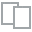
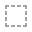
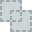
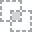
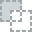
...
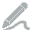
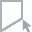
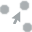
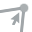
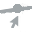

In [87]:
dataprep.eda.plot_missing(train)

  0%|          | 0/209 [00:00<?, ?it/s]


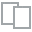
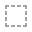
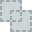
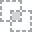
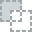
...
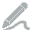
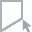
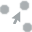
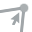
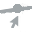

In [88]:
dataprep.eda.plot_missing(test)

Пропущенные значения есть только в столбце education. Заполним эти пропуски модой. Для того, чтобы избежать даже минимальной утечки данных из трейна в тест, заполнение пропусков в тесте надо проводить тем же значением, что и в трейне (то есть не считать моду по тесту, а взять её из трейна). И вообще, все шаги подготовки данных фиттятся на трейне, а применяются потом к тесту\валидации. Поэтому будем готовить pipeline, чтобы гарантировать отсутствие утечек данных. Для подготовки столбцов, которые у нас весьма разнородные, будем использовать ColumnTransfromer.

Посмотрим распределение фичей.

## Сначала трейн

  0%|          | 0/1200 [00:00<?, ?it/s]


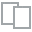
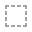
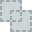
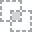
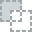
...
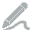
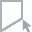
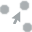
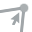
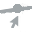

In [89]:
dataprep.eda.plot(train)

С категориальными признаками всё понятно и просто, посмотрим есть ли выбросы в количественных. Все выводы о количественных переменных в конце секции.

**Важно: классы целевой переменной несбалансированы, это надо будет учитывать в логистической регрессии, чтобы получать адекватные precision и recall**

### Возраст

  0%|          | 0/107 [00:00<?, ?it/s]


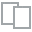
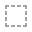
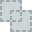
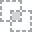
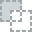
...
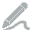
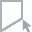
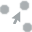
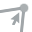
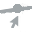

In [90]:
dataprep.eda.plot(train, 'age')

### Количество отказов

  0%|          | 0/107 [00:00<?, ?it/s]


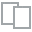
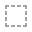
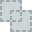
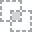
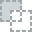
...
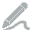
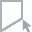
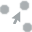
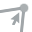
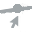

In [91]:
dataprep.eda.plot(train, 'decline_app_cnt')

### Рейтинг БКИ.

  0%|          | 0/107 [00:00<?, ?it/s]


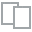
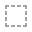
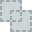
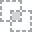
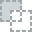
...
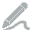
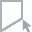
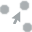
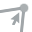
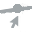

In [92]:
dataprep.eda.plot(train, 'score_bki')

### Количество запросов в БКИ.

  0%|          | 0/107 [00:00<?, ?it/s]


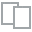
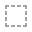
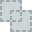
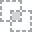
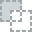
...
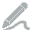
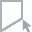
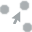
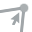
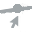

In [93]:
dataprep.eda.plot(train, 'bki_request_cnt')

### Доход.

  0%|          | 0/107 [00:00<?, ?it/s]


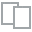
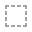
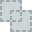
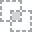
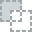
...
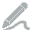
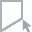
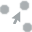
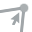
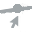

In [94]:
dataprep.eda.plot(train, 'income')

## Вывод по количественным признакам.
Выбросы есть во всех количественных признаках. Но они не кажутся неадекватными, и их доля очень невелика. Поэтому исправлять мы их не будем.
## Теперь тест.
Поскольку выбросы мы решили не исправлять, то достаточно убедиться что всё адекватно.

  0%|          | 0/1092 [00:00<?, ?it/s]


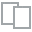
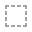
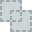
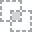
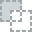
...
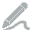
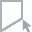
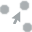
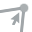
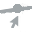

In [95]:
dataprep.eda.plot(test)

Да тоже всё в порядке. Ничего не будем делать с выбросами.

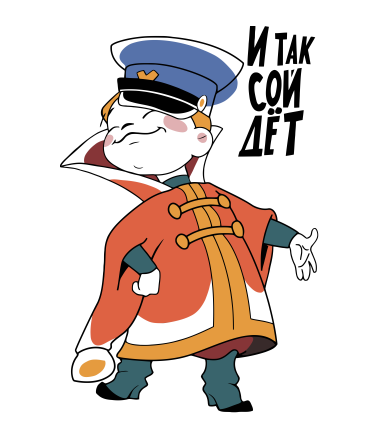

## Корреляции


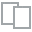
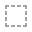
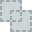
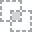
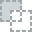
...
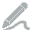
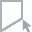
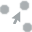
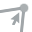
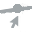

In [96]:
dataprep.eda.plot_correlation(train)

Сильная корреляция наблюдается только между work_address и home_address, ещё есть некоторая зависимость между sna и first_time. На этапе отбора фичей мы решим что с этим делать.

Пока что заполним пропуски и перекодируем фичи средствами pandas, для того чтобы провести отбор фичей. Потом это будет частью пайплайна.

# 2. Отбор и трансформация фичей.

In [97]:
cat_features = ['sex', 'car', 'car_type','foreign_passport', 'work_address', 'home_address', 'sna', 'education']
num_features = ['decline_app_cnt', 'bki_request_cnt', 'income', 'age']
ord_features = ['region_rating', 'first_time']

In [98]:
#загоним app_date в формат unix timestamp
train_for_selection = train.drop(columns = ['client_id', 'default'])
train_for_selection['app_date'] = train_for_selection['app_date'].apply(lambda x: pd.to_datetime(x).timestamp())
train_for_selection['education'].fillna(train_for_selection.education.mode(), inplace = True)
train_for_selection = pd.get_dummies(train_for_selection, columns=cat_features+ord_features)

In [20]:
train_for_selection.sample(5)

,app_date,age,decline_app_cnt,good_work,score_bki,bki_request_cnt,income,sex_F,sex_M,car_N,...,region_rating_30,region_rating_40,region_rating_50,region_rating_60,region_rating_70,region_rating_80,first_time_1,first_time_2,first_time_3,first_time_4
53502,1.398643e+09,40,1,0,-1.923258,2,25000,1,0,1,...,0,0,0,0,1,0,0,0,1,0
48578,1.389398e+09,24,1,0,-2.154921,2,20000,0,1,1,...,0,0,1,0,0,0,0,1,0,0
52342,1.396915e+09,26,0,0,-1.798354,0,30000,0,1,1,...,0,0,0,0,0,1,0,0,1,0
651,1.389571e+09,28,0,1,-2.163473,4,90000,0,1,0,...,0,1,0,0,0,0,0,0,0,1
3228,1.391558e+09,43,0,0,-2.218209,4,25000,0,1,1,...,0,0,1,0,0,0,0,0,1,0


## ANOVA

<AxesSubplot:>

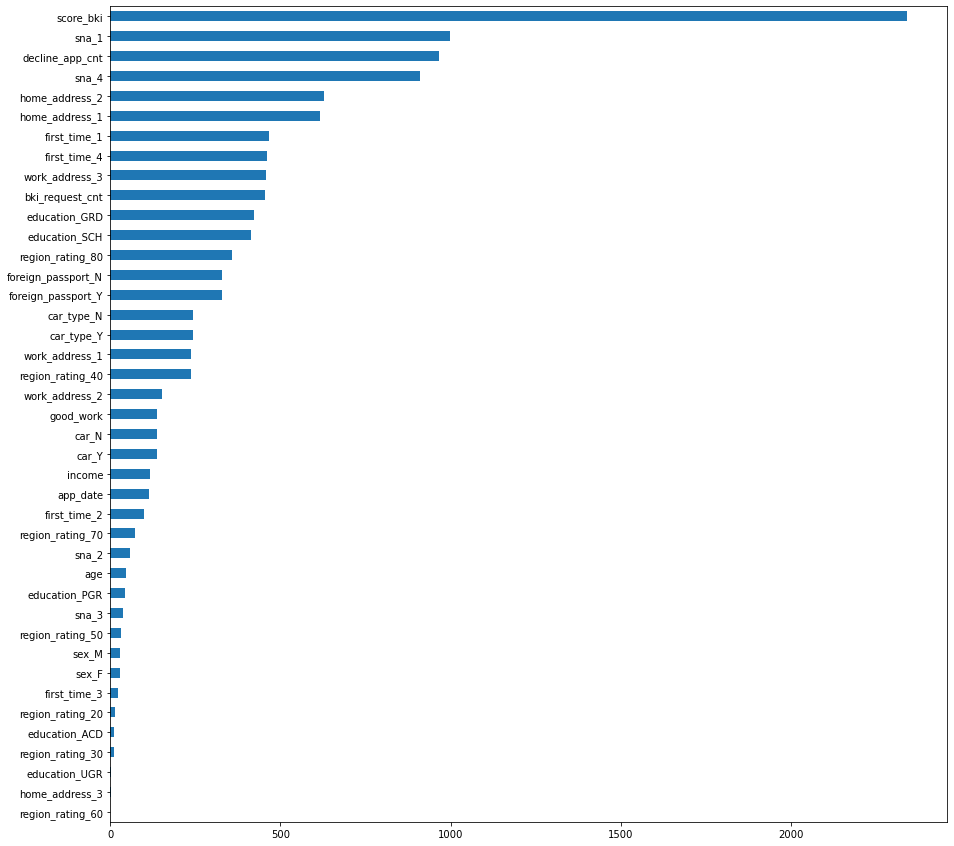

In [21]:
plt.figure(figsize=(15,15))
pd.Series(
    dict(zip(train_for_selection.columns, 
             f_classif(train_for_selection, train['default'])[0])))\
    .sort_values().plot(kind = 'barh')

## Mutual inforamtion.

<AxesSubplot:>

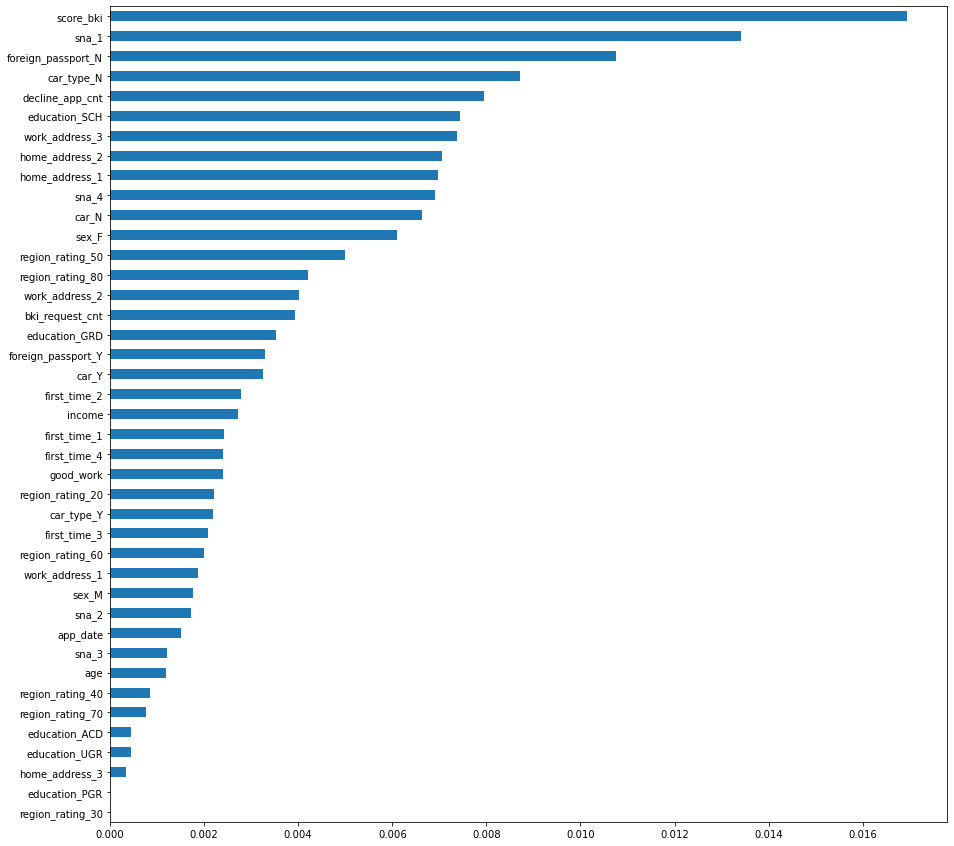

In [100]:
plt.figure(figsize=(15,15))
pd.Series(dict(
    zip(
        train_for_selection.columns, 
                   mutual_info_classif(train_for_selection, train['default']))))\
                   .sort_values().plot(kind='barh')

### Вывод.
Мало влияющие на результат фичи есть. Для линейных методов цели снизить размерность пространства категориальных признаков не стоит, потому что и так всё работает быстро. Для SVM при применении kernel trick вычисления становятся довольно длительными, поэтому будем пробовать отбирать фичи.

**Итого, вот что мы делаем с фичами в "базовом" варианте:**
* client_id - идентификатор клиента. Для модели он не нужен. Трогать его не будем, понадобится исключительно для соотнесения предикта с истинным значением на тесте и валидации.
* education - уровень образования, категориальный признак, заполним пропуски модой и применим к нему OneHotEncoder.
* sex - пол заемщика - бинарный категориальный признак, применим к нему OneHotEncoder, который в данном случае выдаст ровно одну фичу.
* age - возраст заемщика - количественный признак. Правый хвост довольно тяжёлый, распределение похоже на логнормальное. Возьмём логарифм, применим StandardScaler.
* car - флаг наличия автомобиля - категоральный бинарный, OneHotEncoder
* car_type - флаг автомобиля иномарки - категоральный бинарный, OneHotEncoder
* decline_app_cnt - количество отказанных прошлых заявок - количественный признак, больше всего вообще напоминает экспоненциальное распределение. Прибавим единицу и возьмём логарифм.
* good_work - флаг наличия “хорошей” работы - бинарный, можно вообще не трогать
* bki_request_cnt - количество запросов в БКИ - аналогично decline_app_cnt
* home_address - категоризатор домашнего адреса. Вообще не до конца понятно, что это значит. Тут 3 категории (я бы понял, если бы было 2 - заполнен\не заполнен, но 3?). Непонятно, есть ли тут отношение порядка. Попробуем просто перекодировать в dummies.
* work_address - категоризатор рабочего адреса - аналогично предыдущему
* income - доход заемщика - количественный признак, с тяжёлым хвостом. Логарифм, StandardScaler
* foreign_passport - наличие загранпаспорта, бинарный категориальный признак, onehotencoder
* sna - связь заемщика с клиентами банка, абсолютно непонятно значение этого признака. Будем пока считать категориальным и применим onehotencoder
* first_time - давность наличия информации о заемщике. Природа её, возможно и числовая, но тут всего 4 значения. Опять же напрашивается onehotencoder. 
* score_bki - скоринговый балл по данным из БКИ, количественная, кравсивое нормальное распределение, применим standard scaler.
* region_rating - рейтинг региона. Опять же, имеет числовую природу, но всего 4 значения - растаскиваем на dummies.
* app_date - дата подачи заявки - сама по себе бесполезна, но можно повытягивать различные фичи.
* default - флаг дефолта по кредиту - целевая переменная, не трогаем.

Попробуем нагенерить фичей из даты

In [101]:
train_for_features = train.copy()
train_for_features['app_date'] = train_for_features['app_date'].apply(pd.to_datetime)
print(train_for_features['app_date'].dt.year.nunique())

1


Год сразу выбрасываем. Возможные фичи: месяц, число, день недели, выходной или нет. При этом ну прямо совсем маловероятно, что голое число хоть с чем-то коррелирует.

In [102]:
train_for_features['month'] = train_for_features['app_date'].dt.month
train_for_features['day'] = train_for_features['app_date'].dt.day
train_for_features['weekday'] = train_for_features['app_date'].dt.weekday
train_for_features['is_weekend'] = train_for_features['weekday'].apply(lambda x: 1 if x in (5,6) else 0)

In [103]:
train_for_features

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,...,work_address,income,sna,first_time,foreign_passport,default,month,day,weekday,is_weekend
0,25905,2014-02-01,SCH,M,62,Y,Y,0,0,-2.008753,...,2,18000,4,1,N,0,2,1,5,1
1,63161,2014-03-12,SCH,F,59,N,N,0,0,-1.532276,...,3,19000,4,1,N,0,3,12,2,0
2,25887,2014-02-01,SCH,M,25,Y,N,2,0,-1.408142,...,2,30000,1,4,Y,0,2,1,5,1
3,16222,2014-01-23,SCH,F,53,N,N,0,0,-2.057471,...,3,10000,1,3,N,0,1,23,3,0
4,101655,2014-04-18,GRD,M,48,N,N,0,1,-1.244723,...,3,30000,1,4,Y,0,4,18,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73794,54887,2014-03-04,GRD,F,45,N,N,0,0,-1.792064,...,2,17000,4,4,N,0,3,4,1,0
73795,76821,2014-03-24,SCH,M,41,Y,Y,0,0,-2.058029,...,2,70000,1,4,N,0,3,24,0,0
73796,103695,2014-04-22,SCH,M,31,N,N,0,0,-1.512635,...,3,45000,2,2,N,0,4,22,1,0
73797,861,2014-01-04,SCH,F,29,N,N,0,1,-1.479334,...,3,13000,2,3,N,1,1,4,5,1


100%|##########| 4/4 [00:00<?, ?it/s]


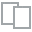
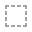
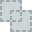
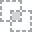
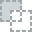
...
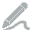
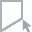
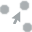
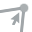
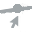

In [104]:
dataprep.eda.plot_correlation(train_for_features)

Полученные фичи не коррелируют с целевой переменной. Зато, очевидно, день недели коррелирует с признаком "выходной". Не будем пользоваться последним признаком. Лучше потом weekday растащим на dummy-переменные. И фичу "число" выкинем, она кажется бесполезной. Напишем класс для генерации новых фичей, со стандартным интерфейсом sklearn, чтобы потом его можно было встроить в пайплайн.

In [27]:
class DateFeatureGenerator(BaseEstimator, TransformerMixin):
    def __init__(self, date_col):
        self.date_col = date_col
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        dates = pd.to_datetime(X[self.date_col])
        ts = dates.apply(lambda x: x.timestamp()).values.reshape(-1,1)
        weekdays = dates.dt.weekday.values.reshape(-1,1)
        months = dates.dt.month.values.reshape(-1,1)
        scl = MinMaxScaler()
        ohe = OneHotEncoder(sparse = False)
        return np.hstack((ohe.fit_transform(weekdays), scl.fit_transform(ts), ohe.fit_transform(months)))

Раскидаем фичи по категориям и напишем пайплайны для обработки образования (заполнение пропусков + onehotencoder) и числовых переменных, требующих логарифмирования и нормализации.

In [28]:
cat_features = ['sex', 'car', 'car_type','foreign_passport', 'work_address', 'home_address', 'sna']
num_features = ['decline_app_cnt', 'bki_request_cnt', 'income', 'age']
ord_features = ['region_rating', 'first_time']
features_to_leave_untouched = ['good_work']
edu_transform_pipe = make_pipeline(SimpleImputer(strategy='most_frequent'), OneHotEncoder(sparse=False)) # пайплайн для обработки образования
numeric_transformer = make_pipeline(FunctionTransformer(func = np.log1p), StandardScaler()) #пайплайн для всех количсественных
remaining_cols = set(train.columns) - set(cat_features)- set(num_features)- set(ord_features) - set(['education']) - set(features_to_leave_untouched)
print(remaining_cols)

{'app_date', 'client_id', 'default', 'score_bki'}


Теперь напишем самцй главный пайплайн по обработке всеx фичей

In [29]:
features_encoder = make_column_transformer(
    (FunctionTransformer(func = lambda x: x), features_to_leave_untouched), #костыль, чтобы не морочиться с remainder и не выковыривать из него app_date
    (edu_transform_pipe, ['education']),
    (OneHotEncoder(drop='if_binary', sparse=False), cat_features+ord_features),
)
num_transformer = make_column_transformer(
    (numeric_transformer, num_features),
    (StandardScaler(), ['score_bki'])
)
poly_num_transformer = make_pipeline(num_transformer, PolynomialFeatures(degree=2))

# Делаем матрицу плана
total_features = FeatureUnion([('gen', DateFeatureGenerator(date_col = 'app_date')),
                               ('encode', features_encoder),
                               ('trans_num', num_transformer)
                                ])
total_features.fit(train.drop(columns = ['default', 'client_id']))
train_features = total_features.transform(train.drop(columns = ['default', 'client_id']))
test_features = total_features.transform(test.drop(columns = ['client_id']))


poly_total_features = FeatureUnion([('gen', DateFeatureGenerator(date_col = 'app_date')),
                               ('encode', features_encoder),
                               ('trans_num_poly', poly_num_transformer)
                                ])
poly_total_features.fit(train.drop(columns = ['default', 'client_id']))
poly_train_features = poly_total_features.transform(train.drop(columns = ['default', 'client_id']))
poly_test_features = poly_total_features.transform(test.drop(columns = ['client_id']))

К сожалению, при обработке в пайплайне не удаётся сохранить имена столбцов (потому что выдача - массив numpy). Тем не менее, с этим можно работать.

In [30]:
X_train, X_test, y_train, y_test = train_test_split(train_features, train['default'], random_state=42, test_size=0.2)
X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(poly_train_features, train['default'], random_state=42, test_size=0.2)

# 3.Простые модели.
## 3.1. Naive Bayes.
При применении наивного байесовского классификатора сразу нужно держать в голове, что его "наивное" предположение о независимости фичей у нас, скорее всего не выполнится. Поэтому сначала попробуем запустить его на полной матрице плана, а потом на топ-10, 20, 30 и 40 фичах по ANOVA, как раз отсечём скоррелированные друг с другом фичи.

In [31]:
def construct_metrics(name, clf, X, y_true):
    y_pred = clf.predict(X)
    y_proba = clf.predict_proba(X)[:,1]
    results = pd.DataFrame(
         {
            'Classifier': str(clf),
            'Accuracy': accuracy_score(y_true, y_pred),
            'Precision': precision_score(y_true, y_pred),
            'Recall': recall_score(y_true, y_pred),
            'F1': f1_score(y_true, y_pred),
            'ROC AUC': roc_auc_score(y_true, y_proba)
         }, index = [name])
    plot_confusion_matrix(clf, X, y_true.values.reshape(-1,1))
    plot_roc_curve(clf, X, y_true.values.reshape(-1,1))
    plot_precision_recall_curve(clf, X, y_true.values.reshape(-1,1))
    return results

,Classifier,Accuracy,Precision,Recall,F1,ROC AUC
Gauss NB without feature selection,GaussianNB(),0.741531,0.242086,0.510673,0.328463,0.70179


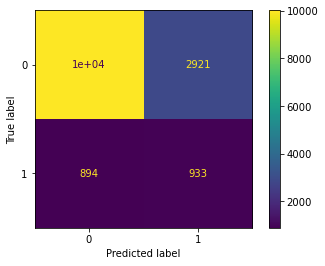

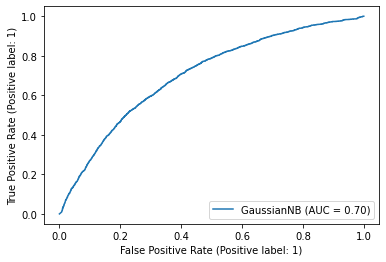

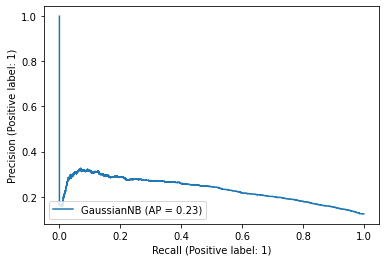

In [32]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)
results = construct_metrics('Gauss NB without feature selection', gnb, X_test, y_test)
results

Ну, лучше чем ничего. Пришлось ввести второе "наивное" допущение по поводу распределния фичей (нормального). Много "нехороших" ошибок, (первого рода, если нулевая гипотеза у нас о том, что клиент дефолтный), или False-Positive(если считать positive = клиент недефолтный). Посмотрим что с отсечением фичей.

In [33]:
nb_with_selection = make_pipeline(SelectKBest(), GaussianNB())
param_grid = {
    'selectkbest__k':range(1,37,1)
    }
gridsearch = GridSearchCV(nb_with_selection, param_grid, scoring='f1', n_jobs=-1)

In [34]:
gridsearch.fit(X_train, y_train)
model = gridsearch.best_estimator_
print(model)

Pipeline(steps=[('selectkbest', SelectKBest(k=31)),
                ('gaussiannb', GaussianNB())])


Classifier    Pipeline(steps=[('selectkbest', SelectKBest(k=...
Accuracy                                               0.745935
Precision                                              0.244893
Recall                                                   0.5052
F1                                                     0.329878
ROC AUC                                                0.703606
Name: Gauss NB with 36 features selected, dtype: object

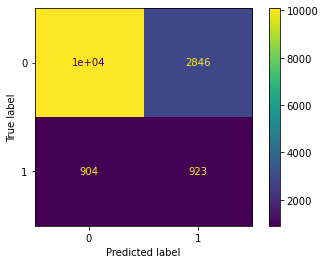

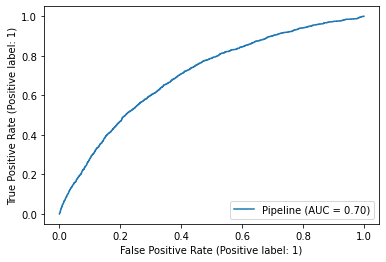

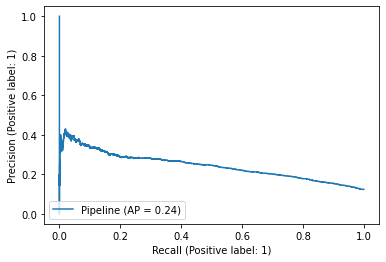

In [35]:
results = results.append(construct_metrics('Gauss NB with 36 features selected', model, X_test, y_test))
results.iloc[-1]

Не помогает отсечение фичей.

Classifier    GaussianNB()
Accuracy          0.788753
Precision         0.252017
Recall            0.359059
F1                0.296163
ROC AUC            0.69489
Name: Gauss NB poly_features, dtype: object

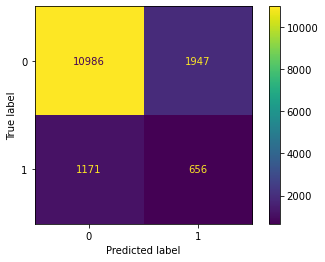

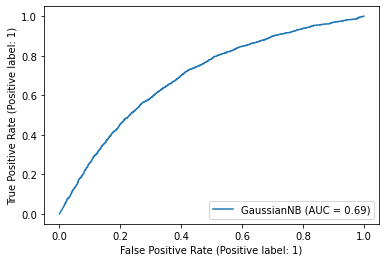

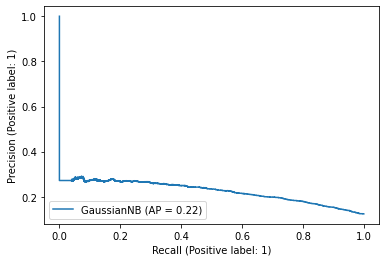

In [36]:
gnb = GaussianNB()
gnb.fit(X_train_p, y_train_p)
results = results.append(construct_metrics('Gauss NB poly_features', gnb, X_test_p, y_test_p))
results.iloc[-1]

От полиномиальных тоже толку мало (что неудивительно, теперь-то у нас железно зависимые фичи есть)

## 3.2. K ближайших соседей.

Classifier    KNeighborsClassifier()
Accuracy                    0.862805
Precision                   0.302789
Recall                      0.083196
F1                          0.130528
ROC AUC                     0.624947
Name: KNN, default parameters, dtype: object

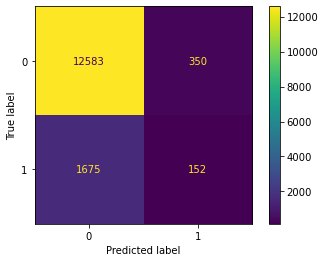

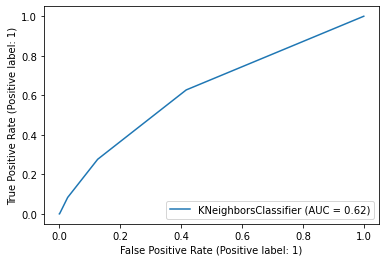

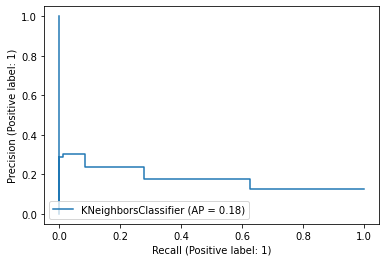

In [37]:
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
results = results.append(construct_metrics('KNN, default parameters', knn, X_test, y_test))
results.iloc[-1]

Дно, попробуем оптимизировать гиперпараметры. А в полиномиальные фичи даже пытаться не будем.

In [38]:
param_grid = [
    {'n_neighbors': range(1,6,1), 
     'weights': ['uniform', 'distance'], 
     'p':[1, 2]
    }
] # остальные гиперпараметры не до конца понятны, а расчёты занимают какое-то время, поэтому лезть туда не стану
gridsearch = GridSearchCV(knn, param_grid, scoring='f1', n_jobs=-1)
gridsearch.fit(X_train, y_train)
model = gridsearch.best_estimator_
model.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 1,
 'p': 1,
 'weights': 'uniform'}

Classifier    KNeighborsClassifier(n_neighbors=1, p=1)
Accuracy                                      0.800813
Precision                                     0.200323
Recall                                        0.203612
F1                                            0.201954
ROC AUC                                       0.544395
Name: KNN, 1 nearest neighbor, dtype: object

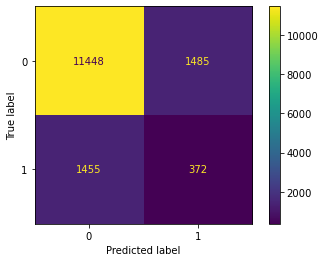

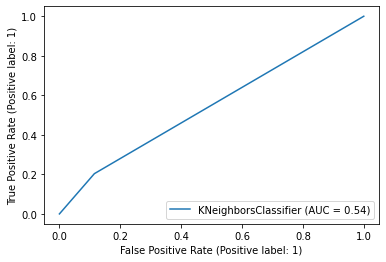

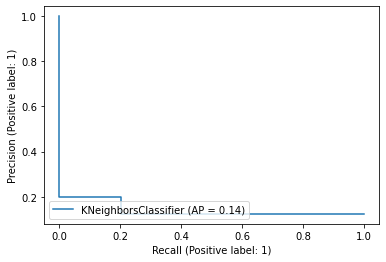

In [39]:
results = results.append(construct_metrics('KNN, 1 nearest neighbor', model, X_test, y_test))
results.iloc[-1]

В общем KNN так себе сработал. С учётом большого количества категориальных фичей это неудивительно.

# 4. Логистическая регрессия.

Classifier    LogisticRegression(max_iter=10000, random_stat...
Accuracy                                               0.874661
Precision                                               0.39823
Recall                                                 0.024631
F1                                                     0.046392
ROC AUC                                                0.744904
Name: Logistic regression, default parameters, dtype: object

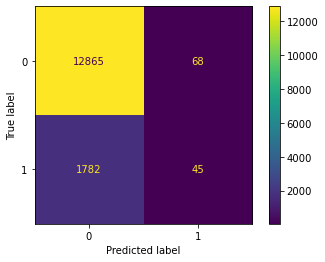

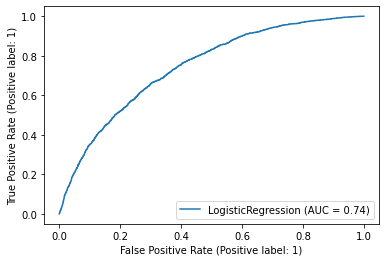

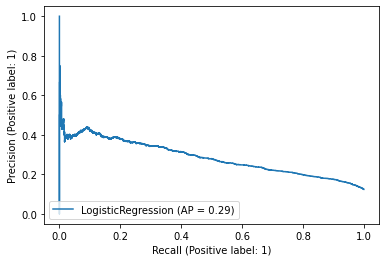

In [40]:
# сначала параметры по умолчанию, только дадим побольше итераций.
logreg = LogisticRegression(max_iter = 10000, random_state=42)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
results = results.append(construct_metrics('Logistic regression, default parameters', logreg, X_test, y_test))
results.iloc[-1]

ROC AUC-то вполне ничего, но вот есть проблема с recall, он вообще никакой. Если оторваться от целевой метрики ROC AUC, то это значит что мы очень плохо отсеиваем дефолтных клиентов. А всё потому, что классы несбалансированы - недефолтных клиентов гораздо больше, чем дефолтных. Поэтому все дальнейшие модели будем запускать с class_weight='balanced'.

In [41]:
logreg.coef_

array([[ 0.0083622 ,  0.027467  , -0.03732542,  0.05793281, -0.06402869,
        -0.00403617, -0.0074973 , -0.30106416,  0.03859123,  0.05173757,
         0.08193726, -0.19139162, -0.18877461, -0.46585359,  0.01703009,
        -0.22924498,  0.40629788,  0.25264503,  0.2678101 , -0.02253062,
        -0.23912376, -0.24056921, -0.24251353,  0.04232416,  0.1810638 ,
        -0.20057151,  0.35528649, -0.17384054, -0.23713152,  0.02284622,
         0.00091307,  0.19424667,  0.44680869,  0.48825336,  0.29700464,
         0.05917396, -0.0550072 , -0.44823751, -0.8071215 ,  0.06110724,
         0.14171191, -0.03117473, -0.19077   ,  0.14084193,  0.17636385,
        -0.01035344, -0.03450844,  0.46080727]])

Веса в регрессии не взорвались, всё в порядке. Видно, что какие-то фичи получают довольно большие коэффициенты, какие-то - близкие к нулю.

Попробуем сбалансировать классы.

Classifier    LogisticRegression(class_weight='balanced', ma...
Accuracy                                               0.669377
Precision                                               0.22421
Recall                                                 0.679256
F1                                                     0.337137
ROC AUC                                                0.744668
Name: Logistic regression, default parameters, balanced classes, dtype: object

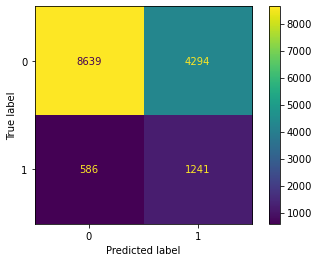

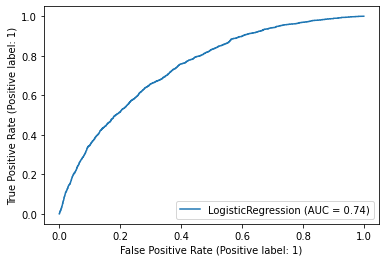

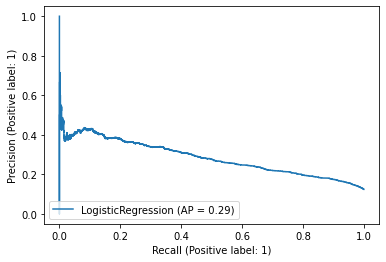

In [42]:
logreg = LogisticRegression(max_iter = 10000, random_state=42, class_weight='balanced')
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)
results = results.append(construct_metrics('Logistic regression, default parameters, balanced classes', logreg, X_test, y_test))
results.iloc[-1]

Так recall у нас хоть как-то стал адекватным, но зато теперь мы допускаем больше ошибок второго рода (считаем недефолтных клиентов дефолтными).
Попробуем полиномиальные фичи.

Classifier    LogisticRegression(class_weight='balanced', ma...
Accuracy                                               0.670664
Precision                                              0.225678
Recall                                                 0.683087
F1                                                     0.339269
ROC AUC                                                0.744295
Name: Logistic regression, default parameters w\poly features, dtype: object

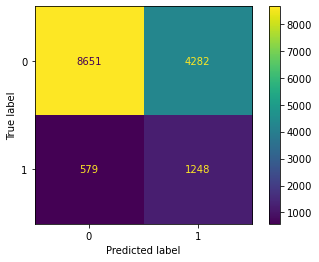

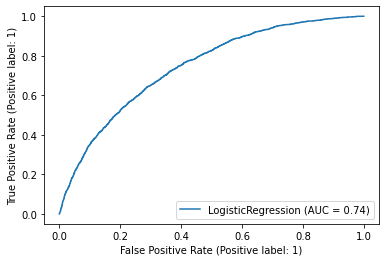

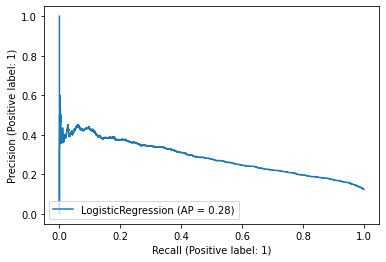

In [43]:
logreg = LogisticRegression(max_iter = 10000, random_state=42,class_weight='balanced')
logreg.fit(X_train_p, y_train_p)
y_pred = logreg.predict(X_test_p)
results = results.append(construct_metrics('Logistic regression, default parameters w\poly features', logreg, X_test_p, y_test_p))
results.iloc[-1]

Огромных качественных изменений нет. Пооптимизируем параметры на оба случая.

Classifier    LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...
Accuracy                                               0.669309
Precision                                              0.224169
Recall                                                 0.679256
F1                                                     0.337091
ROC AUC                                                0.744681
Name: Logistic regression, optimized C for L2, dtype: object

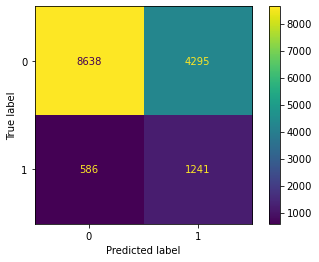

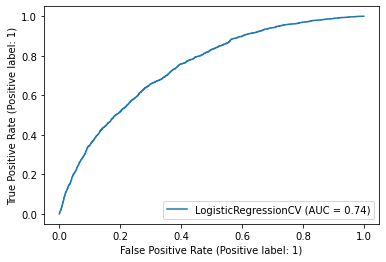

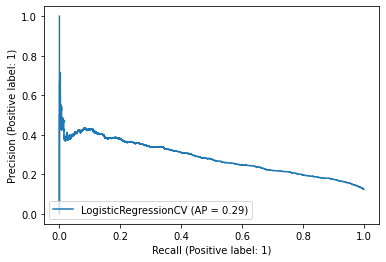

In [44]:
logreg = LogisticRegressionCV(
    Cs = np.linspace(0.2,2,10),
    penalty = 'l2',
    scoring = 'f1',
    max_iter = 10000, 
    random_state=42, 
    class_weight='balanced')
logreg.fit(X_train, y_train)
results = results.append(construct_metrics('Logistic regression, optimized C for L2',logreg, X_test, y_test))
results.iloc[-1]

Classifier    LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...
Accuracy                                               0.669986
Precision                                              0.224873
Recall                                                 0.680898
F1                                                     0.338089
ROC AUC                                                0.744777
Name: Logistic regression, optimized C for L1, dtype: object

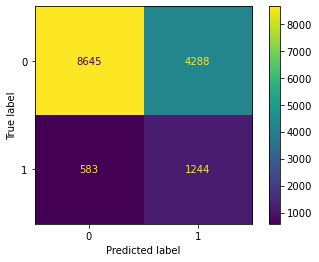

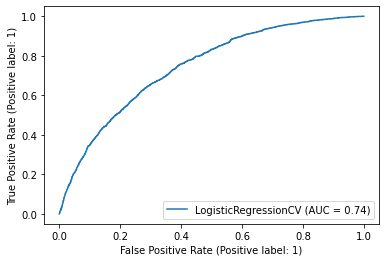

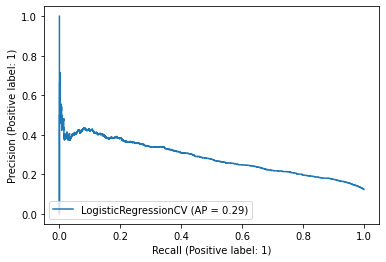

In [45]:
logreg = LogisticRegressionCV(
    Cs = np.linspace(0.2,2,10),
    penalty = 'l1',
    scoring = 'f1',
    solver = 'saga',
    max_iter = 10000, 
    random_state=42, 
    class_weight='balanced')
logreg.fit(X_train, y_train)
# results = results.append(construct_metrics('Logistic regression, optimized C for L1',logreg, X_test, y_test))
# results.iloc[-1]
results = results.append(construct_metrics('Logistic regression, optimized C for L1',logreg, X_test, y_test))
results.iloc[-1]

Classifier    LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...
Accuracy                                               0.669986
Precision                                              0.224873
Recall                                                 0.680898
F1                                                     0.338089
ROC AUC                                                0.744781
Name: Logistic regression, optimized C and L1_ratio for elasticnet, dtype: object

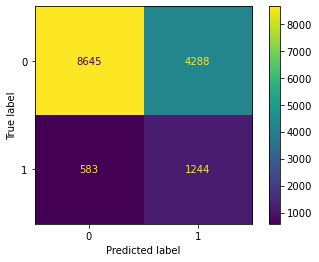

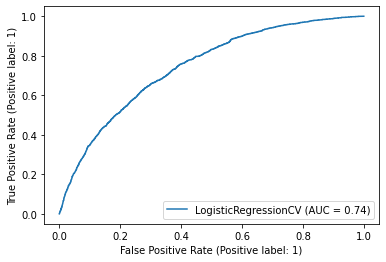

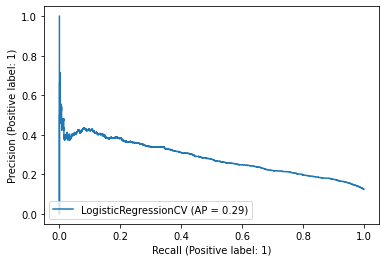

In [46]:
logreg_elastic = LogisticRegressionCV(
    Cs = np.linspace(0.2,2,10),
    penalty = 'elasticnet',
    l1_ratios = np.linspace(0,1,6),
    scoring = 'f1',
    solver = 'saga',
    max_iter = 10000, 
    random_state=42, 
    class_weight='balanced')
logreg_elastic.fit(X_train, y_train)
results = results.append(construct_metrics('Logistic regression, optimized C and L1_ratio for elasticnet',logreg_elastic, X_test, y_test))
results.iloc[-1]

Регуляризация по L1 и L2 нормам выдаёт результат, который где-то там в 6 знаке лучшe

Посмотрим полиномиальные фичи для регуляризации elasticnet.

Classifier    LogisticRegressionCV(Cs=array([0.4, 0.6, 0.8, ...
Accuracy                                               0.670257
Precision                                              0.225533
Recall                                                 0.683634
F1                                                     0.339172
ROC AUC                                                0.744346
Name: Logreg with poly features optimized, dtype: object

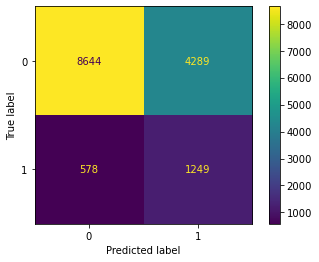

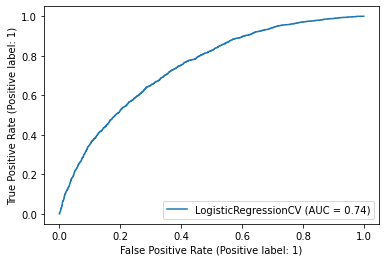

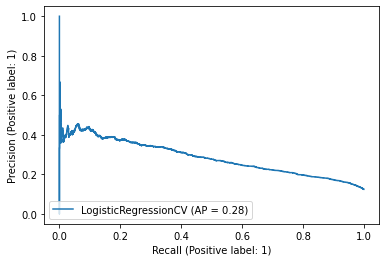

In [47]:
logreg = LogisticRegressionCV(
    Cs = np.linspace(0.4,1,4),
    penalty = 'elasticnet',
    l1_ratios = np.linspace(0,1,4),
    scoring = 'f1',
    solver = 'saga',
    max_iter=10000, 
    tol = 0.001, #чтобы быстрее считалось
    random_state=42, 
    class_weight='balanced')
logreg.fit(X_train_p, y_train_p)
results = results.append(construct_metrics('Logreg with poly features optimized', logreg, X_test_p, y_test_p))
results.iloc[-1]

Итого, лучший результат по ROC AUC получается при использовании регуляризации elasticnet без полиномиальных фичей. Параметры регуляризации такие:

In [48]:
print(f'C = {logreg_elastic.C_[0]}, l1_ratio = {logreg_elastic.l1_ratio_[0]}')

C = 0.2, l1_ratio = 0.8


Проведём кросс-валидацию.

In [49]:
best_logreg = LogisticRegression(
        C = 0.2,
        penalty = 'elasticnet',
        l1_ratio = 0.8,
        solver = 'saga',
        max_iter=10000, 
        tol = 0.001, #чтобы быстрее считалось
        random_state=42, 
        class_weight='balanced')
cvsplitter = StratifiedShuffleSplit(n_splits=5, test_size=0.2, random_state=42)
cross_validate(best_logreg, X_train, y_train, 
               scoring=('recall', 'f1', 'roc_auc'), cv = cvsplitter)

{'fit_time': array([0.43830061, 0.52297497, 0.48846793, 0.71132517, 0.46687818]),
 'score_time': array([0.00987411, 0.01494145, 0.00982761, 0.00950575, 0.01007485]),
 'test_recall': array([0.65341286, 0.657389  , 0.65606362, 0.66136514, 0.67263088]),
 'test_f1': array([0.33548826, 0.34042553, 0.33616299, 0.34038199, 0.34232715]),
 'test_roc_auc': array([0.73002558, 0.72796454, 0.72564805, 0.73264443, 0.72611076])}

И всё-таки она немного переобучается - метрики на кросс-валидации похуже.

Обучим модель на полном трейне и сделаем файл для сабмита.

In [50]:
best_logreg.fit(train_features,train['default'].values)

LogisticRegression(C=0.2, class_weight='balanced', l1_ratio=0.8, max_iter=10000,
                   penalty='elasticnet', random_state=42, solver='saga',
                   tol=0.001)

In [105]:
pd.DataFrame({'client_id':test.client_id.values, 
              'default':best_logreg.predict_proba(test_features)[:,1]})\
              .to_csv('output/submission_best_logreg.csv', index = False)

SyntaxError: invalid syntax (<ipython-input-105-1e130f920e54>, line 2)

# 5. Метод опорных векторов.

Начнём с линейного SVC. В SVC нет метода predict_proba (потому что там нет вероятностей, есть только margin), вместо него decision function, поэтому перепишем метод для метрик.

In [52]:
def construct_metrics_svc(name, clf, X, y_true):
    y_pred = clf.predict(X)
    y_proba = clf.decision_function(X)
    results = pd.DataFrame({
            'Classifier': str(clf),
            'Accuracy': accuracy_score(y_true, y_pred),
            'Precision': precision_score(y_true, y_pred),
            'Recall': recall_score(y_true, y_pred),
            'F1': f1_score(y_true, y_pred),
            'ROC AUC': roc_auc_score(y_true, y_proba)
         }, index = [name])
    plot_confusion_matrix(clf, X, y_true.values.reshape(-1,1))
    plot_roc_curve(clf, X, y_true.values.reshape(-1,1))
    plot_precision_recall_curve(clf, X, y_true.values.reshape(-1,1))
    return results

In [53]:
svmclf = LinearSVC(class_weight='balanced', max_iter=10000)
svmclf.fit(X_train, y_train)

LinearSVC(class_weight='balanced', max_iter=10000)

Classifier    LinearSVC(class_weight='balanced', max_iter=10...
Accuracy                                               0.669648
Precision                                               0.22467
Recall                                                 0.680898
F1                                                      0.33786
ROC AUC                                                0.744885
Name: LinearSVC, dtype: object

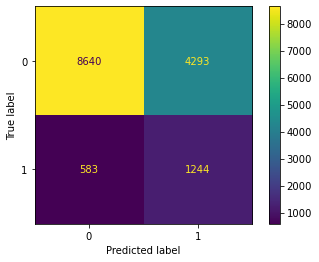

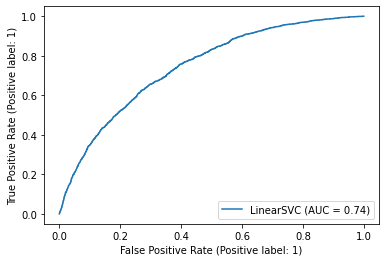

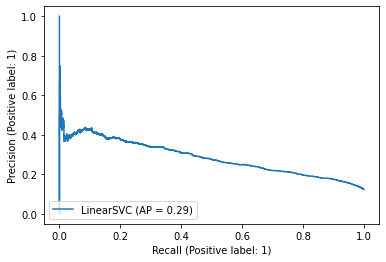

In [54]:
results = results.append(construct_metrics_svc('LinearSVC',svmclf, X_test, y_test))
results.iloc[-1]

Кросс-валидация и подбор гиперпараметров:

In [55]:
params = {
    'C': np.linspace(0.2,2,5),
    'max_iter':[10000]
}
cv = GridSearchCV(svmclf, params, scoring = 'f1', cv=5, n_jobs = 8)
cv.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearSVC(class_weight='balanced', max_iter=10000),
             n_jobs=8,
             param_grid={'C': array([0.2 , 0.65, 1.1 , 1.55, 2.  ]),
                         'max_iter': [10000]},
             scoring='f1')

Classifier    GridSearchCV(cv=5, estimator=LinearSVC(class_w...
Accuracy                                               0.669648
Precision                                               0.22467
Recall                                                 0.680898
F1                                                      0.33786
ROC AUC                                                0.744891
Name: Linear SVC optimized, dtype: object

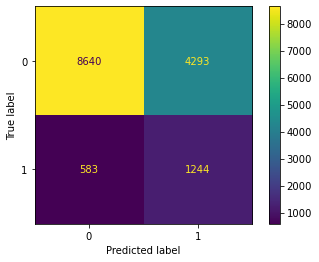

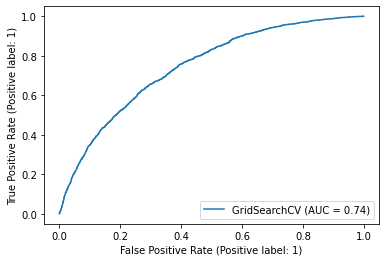

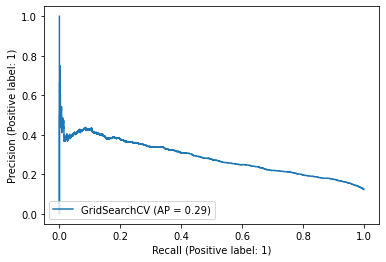

In [56]:
results = results.append(construct_metrics_svc('Linear SVC optimized',cv, X_test, y_test))
results.iloc[-1]

Попробуем kernel trick, со стандартным ядром radial basis function

Classifier    SVC(class_weight='balanced')
Accuracy                          0.689295
Precision                         0.233739
Recall                            0.662835
F1                                0.345605
ROC AUC                           0.730769
Name: SVC with kernel trick, dtype: object

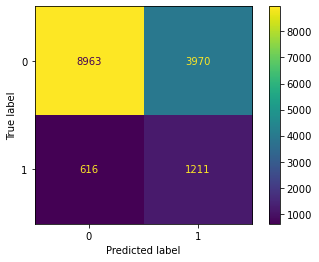

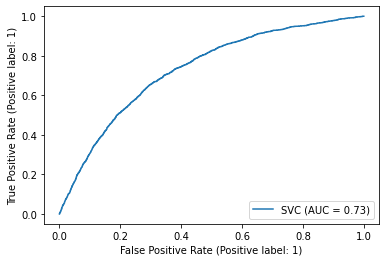

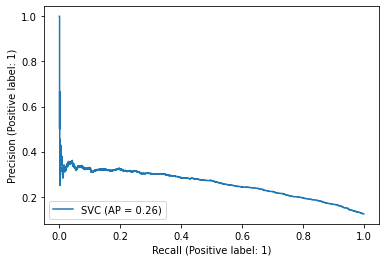

In [57]:
kernel_svc = SVC(class_weight='balanced', max_iter=-1)
kernel_svc.fit(X_train, y_train)
results = results.append(construct_metrics_svc('SVC with kernel trick', kernel_svc, X_test, y_test))
results.iloc[-1]

Очень медленно. Боюсь, что не до кросс-валидации. Обучим на всём трейне линейный SVC и сделаем файл для сабмита.

In [62]:
best_svc = cv.best_estimator_
best_svc.fit(train_features,train['default'].values)

In [63]:
pd.DataFrame({'client_id':test.client_id.values, 
              'default':best_svc.decision_function(test_features)})\
              .to_csv('output/submission_best_svm.csv', index = False)

SVC показал себя не лучше логрегрессии, но работает медленно.


Говорят, что решающие деревья хорошо подходят для подобных задач.

Попробуем их, но не просто в виде решающих деревьев, а с бустингом.


<img src="goose.jpg" alt="Drawing" style="width: 500px;"/>


# 6. XGBoost и Catboost
## 6.1. XGBoost.

/home/rivfader/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Classifier    XGBClassifier(base_score=0.5, booster='gbtree'...
Accuracy                                               0.713279
Precision                                              0.236813
Recall                                                 0.592228
F1                                                     0.338336
ROC AUC                                                0.720496
Name: XG Boost default, dtype: object

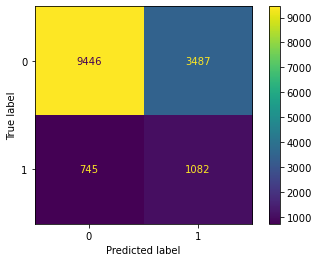

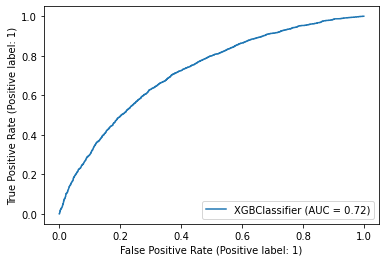

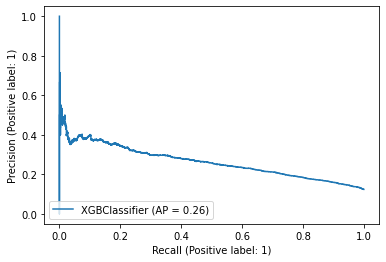

In [64]:
balance_factor = (len(y_train) - sum(y_train))/(sum(y_train)) #пока сбалансируем классы так
xg = xgb.XGBClassifier(scale_pos_weight = balance_factor, eval_metric = 'auc')
xg.fit(X_train, y_train)
results = results.append(construct_metrics('XG Boost default', xg, X_test, y_test))
results.iloc[-1]

ROC AUC получилась относительно хорошая, f1 - примерно как раньше. Попробуем подобрать максимальное количество деревьев.

In [66]:
matr = xgb.DMatrix(X_train, label=y_train)
xg = xgb.XGBClassifier(missing=9999999999,
                    max_depth = 7,
                    n_estimators=700,
                    learning_rate=0.1, 
                    nthread=8,
                    subsample=1.0,
                    max_bin = 1000,
                    colsample_bytree=0.5,
                    min_child_weight = 3,
                    seed=42,
                    scale_pos_weight = balance_factor, 
                    eval_metric = 'auc')
xgb_param = xg.get_xgb_params()
cvresult = xgb.cv(xgb_param, matr, num_boost_round=5000, nfold=15, metrics=['auc'],
     early_stopping_rounds=50, stratified=True, seed=42)
print('Best number of trees = {}'.format(cvresult.shape[0]))

Best number of trees = 45


In [67]:
xg.set_params(n_estimators=cvresult.shape[0])

XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
              colsample_bynode=None, colsample_bytree=0.5, eval_metric='auc',
              gamma=None, gpu_id=None, importance_type='gain',
              interaction_constraints=None, learning_rate=0.1, max_bin=1000,
              max_delta_step=None, max_depth=7, min_child_weight=3,
              missing=9999999999, monotone_constraints=None, n_estimators=45,
              n_jobs=None, nthread=8, num_parallel_tree=None, random_state=None,
              reg_alpha=None, reg_lambda=None,
              scale_pos_weight=6.824917163684559, seed=42, subsample=1.0,
              tree_method=None, validate_parameters=None, verbosity=None)

/home/rivfader/anaconda3/lib/python3.8/site-packages/xgboost/sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Classifier    XGBClassifier(base_score=0.5, booster='gbtree'...
Accuracy                                               0.694241
Precision                                              0.235108
Recall                                                 0.652436
F1                                                     0.345658
ROC AUC                                                0.743483
Name: XG Boost with optimiezed number of trees, dtype: object

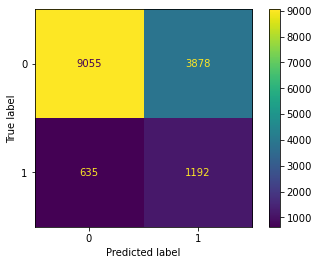

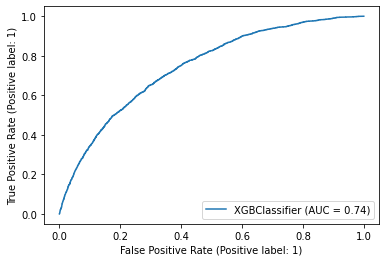

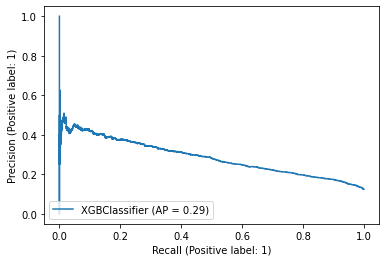

In [68]:
xg.fit(X_train, y_train)
results = results.append(
    construct_metrics('XG Boost with optimiezed number of trees', xg, X_test, y_test))
results.iloc[-1]

Прекрасно, пока что лучший результат. Обучим xgboost на всем доступном трейне.

In [ ]:
matr = xgb.DMatrix(train_features, label=train['default'].values)
xg.fit(train_features,train['default'].values)
pd.DataFrame({'client_id':test.client_id.values, 
              'default':xg.predict_proba(test_features)[:,1]})\
              .to_csv('output/submission_xgboost.csv', index = False)

## 6.2. Catboost.

Classifier    <catboost.core.CatBoostClassifier object at 0x...
Accuracy                                               0.704607
Precision                                              0.232975
Recall                                                 0.604817
F1                                                     0.336377
ROC AUC                                                0.733628
Name: catBoost default, dtype: object

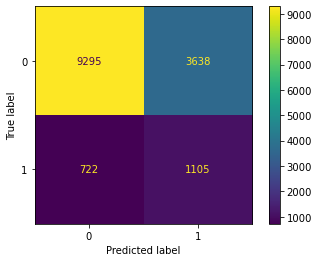

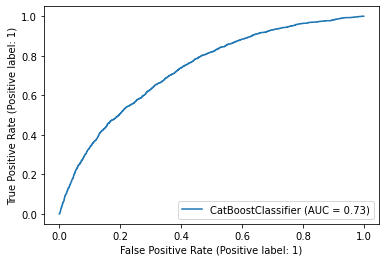

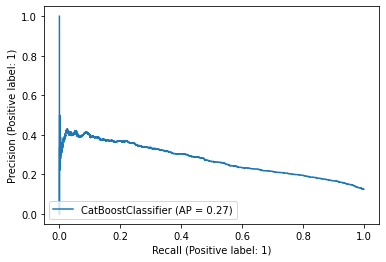

In [71]:
from catboost import CatBoostClassifier, cv, Pool
balance_factor = (len(y_train) - sum(y_train))/(sum(y_train))
catboost = CatBoostClassifier(task_type = 'CPU', 
                              verbose = False, 
                              class_weights = [1, balance_factor])
catboost.fit(X_train, y_train)
results = results.append(construct_metrics('catBoost default', catboost, X_test, y_test))
results.iloc[-1]

Оптимизируем гиперапараметры.

In [72]:
catboost = CatBoostClassifier(task_type = 'CPU', 
                              verbose = False, 
                              class_weights = [1, balance_factor])
grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

grid_search_result = catboost.grid_search(grid, 
                                       X=X_train, 
                                       y=y_train, 
                                       plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.6092539475
bestIteration = 438

0:	loss: 0.6092539	best: 0.6092539 (0)	total: 5.74s	remaining: 2m 46s

bestTest = 0.6103461827
bestIteration = 125

1:	loss: 0.6103462	best: 0.6092539 (0)	total: 11.4s	remaining: 2m 39s

bestTest = 0.6093581623
bestIteration = 499

2:	loss: 0.6093582	best: 0.6092539 (0)	total: 17.2s	remaining: 2m 34s

bestTest = 0.6093148465
bestIteration = 144

3:	loss: 0.6093148	best: 0.6092539 (0)	total: 23.2s	remaining: 2m 30s

bestTest = 0.6084674861
bestIteration = 488

4:	loss: 0.6084675	best: 0.6084675 (4)	total: 30.6s	remaining: 2m 32s

bestTest = 0.6092971991
bestIteration = 178

5:	loss: 0.6092972	best: 0.6084675 (4)	total: 37.6s	remaining: 2m 30s

bestTest = 0.609156202
bestIteration = 550

6:	loss: 0.6091562	best: 0.6084675 (4)	total: 44.9s	remaining: 2m 27s

bestTest = 0.6092471746
bestIteration = 153

7:	loss: 0.6092472	best: 0.6084675 (4)	total: 53.2s	remaining: 2m 26s

bestTest = 0.6089404069
bestIteration = 475

8:	loss: 0.6089404	best: 0.

Classifier    <catboost.core.CatBoostClassifier object at 0x...
Accuracy                                               0.671951
Precision                                              0.225859
Recall                                                 0.679803
F1                                                     0.339066
ROC AUC                                                  0.7468
Name: catBoost depth cv optimized, dtype: object

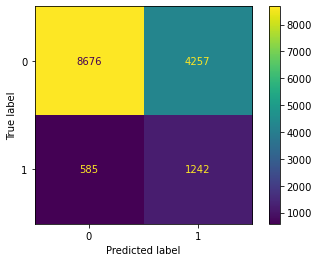

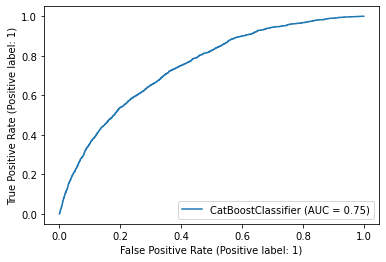

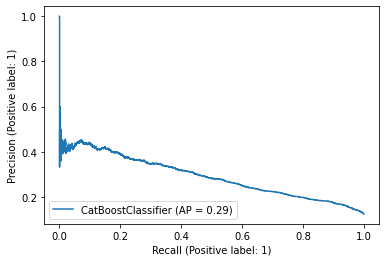

In [73]:
results = results.append(construct_metrics('catBoost depth cv optimized', catboost, X_test, y_test))
results.iloc[-1]

Примем это за финальный результат.

In [74]:
catboost.fit(train_features,train['default'].values)
pd.DataFrame({'client_id':test.client_id.values, 
              'default':catboost.predict_proba(test_features)[:,1]})\
              .to_csv('output/submission_catboost.csv', index = False)

# 7. Выводы.

1. Из рассмотренных методов классификации наименее эффективными оказались методы наивного байесовского классификатора и kNN.
2. В целом эффективность логистичесокй регрессии и методов, основанных на деревьях и бустинге, в *данной задаче* показывают схожую эффективность.
3. Очень важно понимание о сбалансированности классов или об их пропорции.
4. Метрика ROC AUC, как и все остальные, не может быть единственной метрикой качества модели. Необходимо рассматривать комплекс метрик (ROC AUC + precision + recall + f1 score и т.д.)
5. Кросс-валидация позволяет настроить гиперпараметры для оптимального решения.

In [109]:
results.drop(columns = 'Classifier').sort_values(by = 'F1', ascending = False)

,Accuracy,Precision,Recall,F1,ROC AUC
XG Boost with optimiezed number of trees,0.694241,0.235108,0.652436,0.345658,0.743483
SVC with kernel trick,0.689295,0.233739,0.662835,0.345605,0.730769
"Logistic regression, default parameters w\poly features",0.670664,0.225678,0.683087,0.339269,0.744295
Logreg with poly features optimized,0.670257,0.225533,0.683634,0.339172,0.744346
catBoost depth cv optimized,0.671951,0.225859,0.679803,0.339066,0.746800
XG Boost default,0.713279,0.236813,0.592228,0.338336,0.720496
"Logistic regression, optimized C and L1_ratio for elasticnet",0.669986,0.224873,0.680898,0.338089,0.744781
"Logistic regression, optimized C for L1",0.669986,0.224873,0.680898,0.338089,0.744777
LinearSVC,0.669648,0.224670,0.680898,0.337860,0.744885
Linear SVC optimized,0.669648,0.224670,0.680898,0.337860,0.744891


In [78]:
results.sort_values(by = 'ROC AUC', ascending = False)

,Classifier,Accuracy,Precision,Recall,F1,ROC AUC
catBoost depth cv optimized,<catboost.core.CatBoostClassifier object at 0x...,0.671951,0.225859,0.679803,0.339066,0.746800
"Logistic regression, default parameters","LogisticRegression(max_iter=10000, random_stat...",0.874661,0.398230,0.024631,0.046392,0.744904
Linear SVC optimized,"GridSearchCV(cv=5, estimator=LinearSVC(class_w...",0.669648,0.224670,0.680898,0.337860,0.744891
LinearSVC,"LinearSVC(class_weight='balanced', max_iter=10...",0.669648,0.224670,0.680898,0.337860,0.744885
"Logistic regression, optimized C and L1_ratio for elasticnet","LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...",0.669986,0.224873,0.680898,0.338089,0.744781
"Logistic regression, optimized C for L1","LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...",0.669986,0.224873,0.680898,0.338089,0.744777
"Logistic regression, optimized C for L2","LogisticRegressionCV(Cs=array([0.2, 0.4, 0.6, ...",0.669309,0.224169,0.679256,0.337091,0.744681
"Logistic regression, default parameters, balanced classes","LogisticRegression(class_weight='balanced', ma...",0.669377,0.224210,0.679256,0.337137,0.744668
Logreg with poly features optimized,"LogisticRegressionCV(Cs=array([0.4, 0.6, 0.8, ...",0.670257,0.225533,0.683634,0.339172,0.744346
"Logistic regression, default parameters w\poly features","LogisticRegression(class_weight='balanced', ma...",0.670664,0.225678,0.683087,0.339269,0.744295


In [111]:
list(range(7,37,10))


[7, 17, 27]